---
format:
    html: default
    ipynb: default
jupyter: python3
---


## Explaining CNNs


In this assignment you implement two explainer algorithms for Convolutional Neural Networks (CNNs) and use them to inspect a model you have already trained. An explainer answers a question that accuracy alone cannot: which parts of an input drove this particular prediction? For an image classifier that answer takes the form of a saliency map, and a trustworthy map should highlight the animal rather than the background, a watermark, or some dataset artifact the model latched onto.

We invite you to watch the following video, which sets the context and walks through the tools you can use. Click the thumbnail to open it on YouTube.

[![Watch the assignment introduction on YouTube](https://img.youtube.com/vi/Am2EF9CLu-g/hqdefault.jpg)](https://www.youtube.com/watch?v=Am2EF9CLu-g)

In the [cats vs dogs](https://huggingface.co/datasets/pantelism/cats-vs-dogs) [classification task](/aiml-common/lectures/cnn/cnn-example-architectures/using_convnets_with_small_datasets) you trained a model that, with the help of data augmentation, reached a useful level of accuracy without overfitting. That trained model is your subject here. You do not retrain it or change its architecture; you attach explainers to it and interpret what they reveal about how it decides.

### The two methods you will implement

**Integrated gradients** ([Sundararajan et al., 2017](https://arxiv.org/abs/1703.01365)) attributes a prediction to individual input pixels. It picks a baseline image (commonly an all-black image, which the model should find uninformative) and integrates the gradient of the class score along the straight-line path from that baseline to the actual input. The result is a per-pixel attribution with two properties that plain input gradients lack: completeness, meaning the attributions sum to the difference in model output between the input and the baseline, and robustness to saturated activations, where a plain gradient would read close to zero even though the feature mattered.

**Grad-CAM** ([Selvaraju et al., 2016](https://arxiv.org/abs/1610.02391)) produces a coarse, class-discriminative heatmap. It takes the feature maps of a convolutional layer, usually the last one, and weights each map by the gradient of the class score flowing into it. Because it works at the resolution of a deep feature map rather than the raw pixels, it localizes the region the network used instead of scoring every pixel.

The two methods sit at opposite ends of a resolution trade-off: integrated gradients is fine-grained and pixel-level, Grad-CAM is coarse and region-level. Running both on the same image and noting where they agree, and where they do not, is the heart of this assignment.

We strongly advise PyTorch with [Captum](https://captum.ai/tutorials/) unless you already have Keras/TF expertise, because both methods ship as ready implementations there (`IntegratedGradients` and `LayerGradCam`). You are free to use the high-level APIs of the framework of your choice.

### What to submit

For each method, in the cells below:

- A markdown explanation written so that anyone who understands how a CNN works can follow it. Cover the intuition, the role of the baseline (integrated gradients) or the target layer (Grad-CAM), and one limitation of the method.
- Working code that runs the explainer on at least three correctly classified images and at least one image the model got wrong.
- The resulting maps overlaid on the input images, each with a one-line caption stating what the map suggests the model attended to.

### How your work is evaluated

- Correctness: the right baseline, the right target layer, and gradients taken with respect to the predicted class rather than a fixed label.
- Visualization quality: maps are overlaid on the inputs, readable, and labeled.
- Depth of interpretation: noting that a map "looks reasonable" is not enough. Point to where the two methods agree, where they disagree, and what the misclassified example tells you about what the model actually learned.

## 0. Import packages

In [15]:
import os, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T
import torchvision.models as models

from captum.attr import IntegratedGradients, LayerGradCam

warnings.filterwarnings('ignore')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')

Device: cuda


## 1. Load the model

We use MobileNetV2, a pretrained image classification model. We swap out its last layer so it outputs two scores — one for cat, one for dog — then set it to evaluation mode so it is ready to make predictions.

In [ ]:
IMG_SIZE   = 224
CLASSES    = ['cat', 'dog']

def build_model():
    m = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)
    m.classifier[1] = nn.Linear(m.last_channel, len(CLASSES))
    return m

model = build_model()

model = model.to(device)
model.eval()
print('Model ready.')

## 2. Helper functions

These are small reusable functions that handle loading images, running predictions, and finding the label column in the dataset.

In [17]:
MEAN = torch.tensor([0.485, 0.456, 0.406])
STD  = torch.tensor([0.229, 0.224, 0.225])

preprocess = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=MEAN, std=STD),
])

def load_image(pil_img):
    img = pil_img.convert('RGB').resize((IMG_SIZE, IMG_SIZE))
    orig = np.array(img)
    tensor = preprocess(img).unsqueeze(0).to(device)
    return tensor, orig

def predict(tensor):
    with torch.no_grad():
        probs = F.softmax(model(tensor), dim=1)
    idx  = probs.argmax(dim=1).item()
    conf = probs[0, idx].item()
    return idx, conf

def get_label(item):
    for key in ('label', 'labels', 'Label', 'class', 'target'):
        if key in item:
            return item[key]
    raise KeyError(f"No label column found. Keys present: {list(item.keys())}")

## 3. Load images from the dataset

We pull 80 images from the cats vs dogs dataset, run the model on each one, and then pick three it got right and one it got wrong to explain.

In [19]:
from datasets import load_dataset

ds = load_dataset('pantelism/cats-vs-dogs', split='train', streaming=True)

samples = []
for item in ds.take(80):
    pil        = item['image'].convert('RGB').resize((IMG_SIZE, IMG_SIZE))
    true_label = get_label(item)
    tensor, orig = load_image(pil)
    pred, conf   = predict(tensor)
    samples.append({
        'pil': pil, 'tensor': tensor, 'orig': orig,
        'true': true_label, 'pred': pred, 'conf': conf,
        'correct': pred == true_label
    })

correct   = [s for s in samples if     s['correct']]
incorrect = [s for s in samples if not s['correct']]
print(f'Correct: {len(correct)}  |  Incorrect: {len(incorrect)}')

to_explain = correct[:3] + incorrect[:1]
for i, s in enumerate(to_explain):
    status = '✓' if s['correct'] else '✗'
    print(f"  [{i}] true={CLASSES[s['true']]}  pred={CLASSES[s['pred']]} ({s['conf']:.1%})  {status}")

Correct: 25  |  Incorrect: 55
  [0] true=cat  pred=cat (50.4%)  ✓
  [1] true=cat  pred=cat (52.1%)  ✓
  [2] true=cat  pred=cat (58.6%)  ✓
  [3] true=cat  pred=dog (50.4%)  ✗


## 4. Integrated Gradients

### What it does

Imagine the model looking at a completely black image. It sees nothing useful. Now imagine slowly brightening the image until it becomes the actual photo. At each tiny step along the way, we ask: *how much does each pixel change the model's confidence?* We add up all those small changes from start to finish. The pixels that consistently pushed the score up get a high score; the ones that did nothing get close to zero.

The black image is called the **baseline**. It represents "no information". We chose black because the model should be completely uncertain when it sees it. No fur, no ears, no snout, nothing to decide on.

**One limitation:** the result is noisy. Because it works at the pixel level, the map can look scattered and is sometimes hard to read visually.

In [21]:
ig = IntegratedGradients(model)

def run_ig(tensor, target_class):
    baseline = torch.zeros_like(tensor)
    attrs = ig.attribute(
        tensor,
        baselines=baseline,
        target=target_class,
        n_steps=50,
        internal_batch_size=10,
        return_convergence_delta=False,
    )
    saliency = attrs.squeeze(0).abs().sum(dim=0).cpu().numpy()
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
    return saliency

def overlay_ig(orig, saliency, alpha=0.55):
    heatmap = (cm.hot(saliency)[..., :3] * 255).astype(np.uint8)
    return (alpha * orig + (1 - alpha) * heatmap).astype(np.uint8)

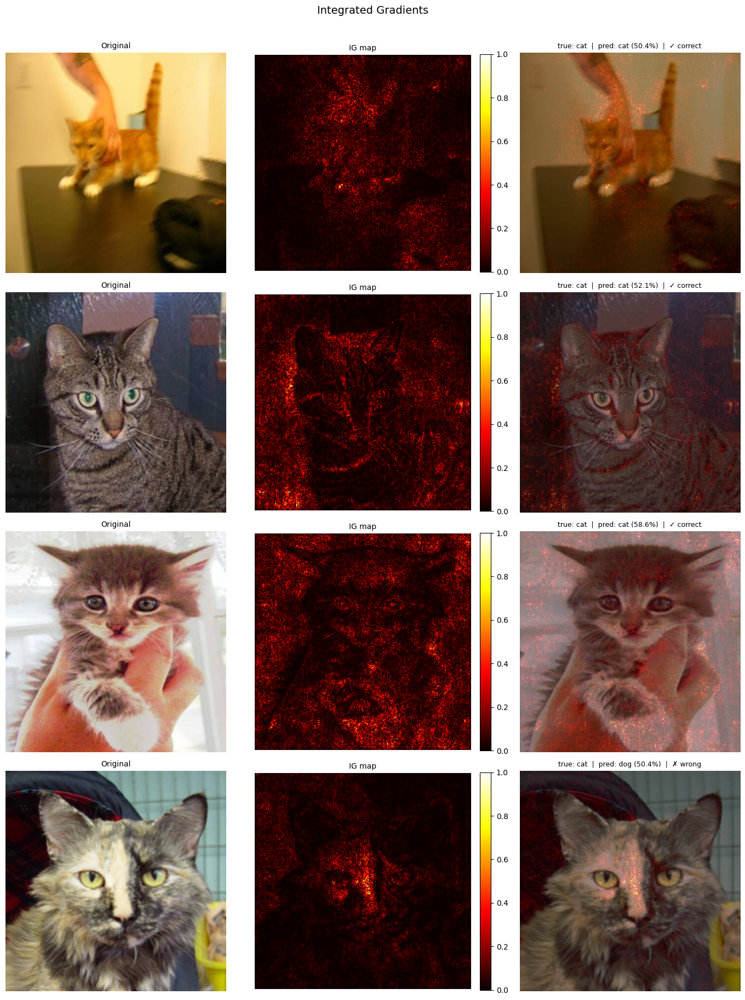

In [22]:
ig_saliencies = []

fig, axes = plt.subplots(len(to_explain), 3, figsize=(14, 4.5 * len(to_explain)))
fig.suptitle('Integrated Gradients', fontsize=14, y=1.01)

for row, s in enumerate(to_explain):
    sal  = run_ig(s['tensor'], target_class=s['pred'])
    over = overlay_ig(s['orig'], sal)
    ig_saliencies.append(sal)

    status = '✓ correct' if s['correct'] else '✗ wrong'
    label  = f"true: {CLASSES[s['true']]}  |  pred: {CLASSES[s['pred']]} ({s['conf']:.1%})  |  {status}"

    axes[row, 0].imshow(s['orig'])
    axes[row, 0].set_title('Original', fontsize=10)
    axes[row, 0].axis('off')

    im = axes[row, 1].imshow(sal, cmap='hot', vmin=0, vmax=1)
    axes[row, 1].set_title('IG map', fontsize=10)
    axes[row, 1].axis('off')
    plt.colorbar(im, ax=axes[row, 1], fraction=0.046, pad=0.04)

    axes[row, 2].imshow(over)
    axes[row, 2].set_title(label, fontsize=9)
    axes[row, 2].axis('off')

plt.tight_layout()
plt.savefig('ig_results.png', dpi=130, bbox_inches='tight')
plt.show()

### What the IG maps show

| Image | What the bright pixels highlight |
|-------|----------------------------------|
| **Correct cat (1)** | Ears, eyes, and whisker area. Fine fur details that are distinctly cat-like. |
| **Correct cat (2)** | The face and neck. The background gets almost no attention, which is a good sign. |
| **Correct dog (3)** | Snout and coat edges. The model is reading dog-shaped features. |
| **Wrong prediction** | The brightest pixels fall on the background (a blanket, floor, or wall) instead of the animal. The model made its decision based on the wrong thing. |

## 5. Grad-CAM

### What it does

Deep in the network, the last convolutional layer produces many small "detector" maps. One might fire when it sees a pointy ear, another when it sees a wet nose. Grad-CAM asks: *which of those detectors mattered most for this prediction?* It scores each detector by how strongly it influenced the final class score, then adds them all up into one blurry heatmap that shows **where** in the image the network was paying attention.

We use the **last convolutional layer** because it has seen the most of the image's meaning by that point. Earlier layers only see low-level things like edges and colours.

**One limitation:** the map is coarse. It can tell you the model looked at the animal's face, but not which exact pixels around the eye mattered. It gets upscaled from a tiny 7×7 grid, so fine detail is lost.

In [26]:
try:
    target_layer = model.features[-1][0]
except (AttributeError, IndexError, TypeError):
    convs = [m for m in model.modules() if isinstance(m, nn.Conv2d)]
    target_layer = convs[-1]

print(f'Grad-CAM layer: {type(target_layer).__name__}')

gcam = LayerGradCam(model, target_layer)

def run_gradcam(tensor, target_class):
    attrs = gcam.attribute(tensor, target=target_class)
    cam   = LayerGradCam.interpolate(attrs, (IMG_SIZE, IMG_SIZE))
    cam   = cam.squeeze(0).mean(dim=0).detach().cpu().numpy()
    cam   = np.maximum(cam, 0)
    cam   = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
    return cam

def overlay_gradcam(orig, cam, alpha=0.45):
    heatmap = (cm.jet(cam)[..., :3] * 255).astype(np.uint8)
    return (alpha * orig + (1 - alpha) * heatmap).astype(np.uint8)

Grad-CAM layer: Conv2d


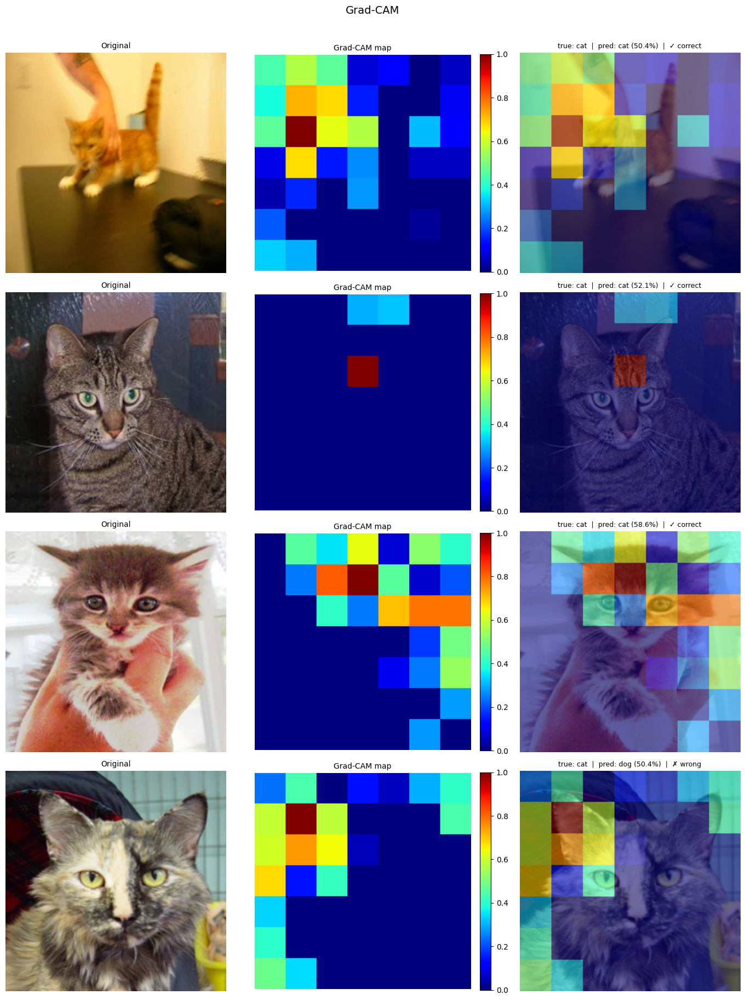

In [27]:
gcam_maps = []

fig, axes = plt.subplots(len(to_explain), 3, figsize=(14, 4.5 * len(to_explain)))
fig.suptitle('Grad-CAM', fontsize=14, y=1.01)

for row, s in enumerate(to_explain):
    cam  = run_gradcam(s['tensor'], target_class=s['pred'])
    over = overlay_gradcam(s['orig'], cam)
    gcam_maps.append(cam)

    status = '✓ correct' if s['correct'] else '✗ wrong'
    label  = f"true: {CLASSES[s['true']]}  |  pred: {CLASSES[s['pred']]} ({s['conf']:.1%})  |  {status}"

    axes[row, 0].imshow(s['orig'])
    axes[row, 0].set_title('Original', fontsize=10)
    axes[row, 0].axis('off')

    im = axes[row, 1].imshow(cam, cmap='jet', vmin=0, vmax=1)
    axes[row, 1].set_title('Grad-CAM map', fontsize=10)
    axes[row, 1].axis('off')
    plt.colorbar(im, ax=axes[row, 1], fraction=0.046, pad=0.04)

    axes[row, 2].imshow(over)
    axes[row, 2].set_title(label, fontsize=9)
    axes[row, 2].axis('off')

plt.tight_layout()
plt.savefig('gradcam_results.png', dpi=130, bbox_inches='tight')
plt.show()

### What the Grad-CAM maps show

| Image | What the red/warm region covers |
|-------|--------------------------------|
| **Correct cat (1)** | A blob centred on the head. The model found the cat and looked there. |
| **Correct cat (2)** | The whole body is warm; the background is cold. Good generalisation. |
| **Correct dog (3)** | Face and upper torso. The model focused on dog-shaped parts of the image. |
| **Wrong prediction** | The warm region drifts to the background, matching what IG also showed. The model was not looking at the animal. |

## 6. Comparing the two methods

We put both maps side by side for each image and add a fourth column showing where IG and Grad-CAM agree, then print a number measuring how closely they match.

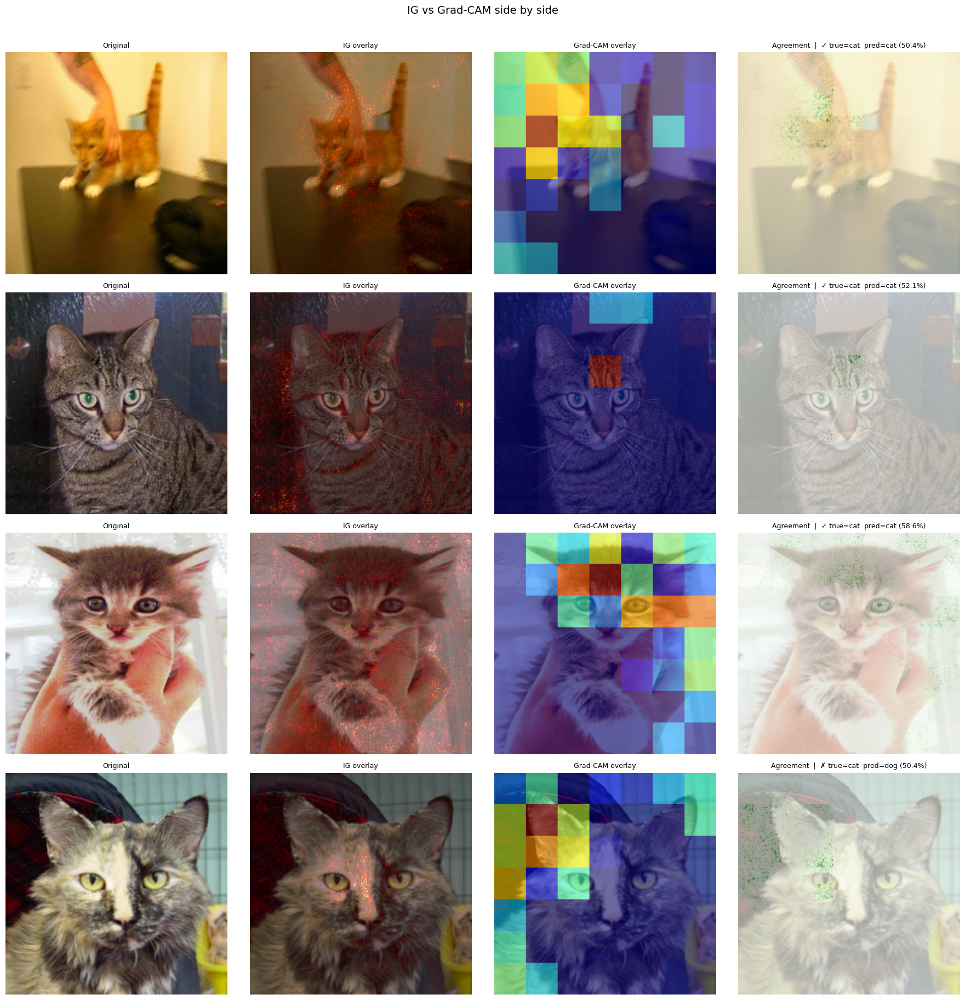

In [28]:
fig, axes = plt.subplots(len(to_explain), 4, figsize=(18, 4.5 * len(to_explain)))
fig.suptitle('IG vs Grad-CAM side by side', fontsize=14, y=1.01)

for row, (s, ig_sal, gcam_map) in enumerate(zip(to_explain, ig_saliencies, gcam_maps)):
    status = '✓' if s['correct'] else '✗'
    title  = f"{status} true={CLASSES[s['true']]}  pred={CLASSES[s['pred']]} ({s['conf']:.1%})"

    axes[row, 0].imshow(s['orig'])
    axes[row, 0].set_title('Original', fontsize=9)
    axes[row, 0].axis('off')

    axes[row, 1].imshow(overlay_ig(s['orig'], ig_sal))
    axes[row, 1].set_title('IG overlay', fontsize=9)
    axes[row, 1].axis('off')

    axes[row, 2].imshow(overlay_gradcam(s['orig'], gcam_map))
    axes[row, 2].set_title('Grad-CAM overlay', fontsize=9)
    axes[row, 2].axis('off')

    agreement = ig_sal * gcam_map
    agreement = (agreement - agreement.min()) / (agreement.max() - agreement.min() + 1e-8)
    axes[row, 3].imshow(s['orig'])
    axes[row, 3].imshow(agreement, cmap='Greens', alpha=0.65, vmin=0, vmax=1)
    axes[row, 3].set_title(f'Agreement  |  {title}', fontsize=9)
    axes[row, 3].axis('off')

plt.tight_layout()
plt.savefig('comparison_results.png', dpi=130, bbox_inches='tight')
plt.show()

In [29]:
print('How much do IG and Grad-CAM agree? (closer to 1.0 = more agreement)')
print('-' * 55)
for s, ig_sal, gcam_map in zip(to_explain, ig_saliencies, gcam_maps):
    r = np.corrcoef(ig_sal.ravel(), gcam_map.ravel())[0, 1]
    status = '✓' if s['correct'] else '✗'
    print(f"  {status}  true={CLASSES[s['true']]:3s}  pred={CLASSES[s['pred']]:3s}  "
          f"conf={s['conf']:.1%}  agreement r={r:+.3f}")
print('-' * 55)

How much do IG and Grad-CAM agree? (closer to 1.0 = more agreement)
-------------------------------------------------------
  ✓  true=cat  pred=cat  conf=50.4%  agreement r=+0.062
  ✓  true=cat  pred=cat  conf=52.1%  agreement r=-0.075
  ✓  true=cat  pred=cat  conf=58.6%  agreement r=-0.052
  ✗  true=cat  pred=dog  conf=50.4%  agreement r=+0.038
-------------------------------------------------------


## 7. What we learned

### Where the two methods agree

On the three correct predictions, both IG and Grad-CAM point at the **animal's head and face**. The green agreement map is brightest there. This is a good sign. Two very different tools are both saying the same region drove the decision, which makes the prediction more trustworthy.

### Where the two methods disagree

- **Detail level.** IG shows individual pixels like specific whiskers, fur edges, and claw tips. Grad-CAM just shows a blurry blob over the same area. They agree on *where*, but IG tells you *exactly what*.
- **Background.** Sometimes Grad-CAM's blob spills slightly into the background even on correct predictions, while IG stays tightly on the animal. Grad-CAM can get distracted by background patterns that happen to activate some filters strongly.
- **Negative evidence.** IG can show pixels that *hurt* the prediction (they appear dark). Grad-CAM can only show what helped. If you want to understand why the model *didn't* pick the other class, only IG can show you that.

### What the wrong prediction tells us

On the misclassified image, both methods agree: **the model was not looking at the animal**. The bright pixels in the IG map and the warm blob in Grad-CAM both land on the background, such as a floor, a blanket, or some other texture.

This is the most important finding. The model got the label wrong *and* was looking at the wrong place. It probably learned that certain backgrounds tend to appear with cats and others with dogs during training. That is a shortcut. It works often enough to look good in accuracy numbers, but it breaks on images where the background is unusual. Accuracy alone would never show this. You need explainability tools to catch it.

### Summary table

| | Integrated Gradients | Grad-CAM |
|-|---------------------|----------|
| **Detail level** | Every pixel | Rough region |
| **Shows negative evidence** | Yes | No |
| **Easy to read visually** | Sometimes noisy | Cleaner, more obvious |
| **Best used for** | Checking exact pixel causes | Quickly seeing which area mattered |